In [1]:
import tensorflow as tf
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt

In [2]:
(train_data, test_data), info = tfds.load('food101',
                                          as_supervised=True,
                                          split=['train', 'validation'],
                                          shuffle_files=True,
                                          with_info=True,
                                          )

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/2 [00:00<?, ? splits/s]

Shuffling /root/tensorflow_datasets/food101/2.0.0.incompleteTVH1JK/food101-train.tfrecord*...:   0%|          …

Generating validation examples...:   0%|          | 0/25250 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/food101/2.0.0.incompleteTVH1JK/food101-validation.tfrecord*...:   0%|     …

Dataset food101 downloaded and prepared to /root/tensorflow_datasets/food101/2.0.0. Subsequent calls will reuse this data.


In [3]:
class_names = info.features['label'].names
class_names

['apple_pie',
 'baby_back_ribs',
 'baklava',
 'beef_carpaccio',
 'beef_tartare',
 'beet_salad',
 'beignets',
 'bibimbap',
 'bread_pudding',
 'breakfast_burrito',
 'bruschetta',
 'caesar_salad',
 'cannoli',
 'caprese_salad',
 'carrot_cake',
 'ceviche',
 'cheesecake',
 'cheese_plate',
 'chicken_curry',
 'chicken_quesadilla',
 'chicken_wings',
 'chocolate_cake',
 'chocolate_mousse',
 'churros',
 'clam_chowder',
 'club_sandwich',
 'crab_cakes',
 'creme_brulee',
 'croque_madame',
 'cup_cakes',
 'deviled_eggs',
 'donuts',
 'dumplings',
 'edamame',
 'eggs_benedict',
 'escargots',
 'falafel',
 'filet_mignon',
 'fish_and_chips',
 'foie_gras',
 'french_fries',
 'french_onion_soup',
 'french_toast',
 'fried_calamari',
 'fried_rice',
 'frozen_yogurt',
 'garlic_bread',
 'gnocchi',
 'greek_salad',
 'grilled_cheese_sandwich',
 'grilled_salmon',
 'guacamole',
 'gyoza',
 'hamburger',
 'hot_and_sour_soup',
 'hot_dog',
 'huevos_rancheros',
 'hummus',
 'ice_cream',
 'lasagna',
 'lobster_bisque',
 'lobster

In [ ]:
len(test_data)

25250

In [ ]:
len(train_data)

75750

# Displaying Random Images

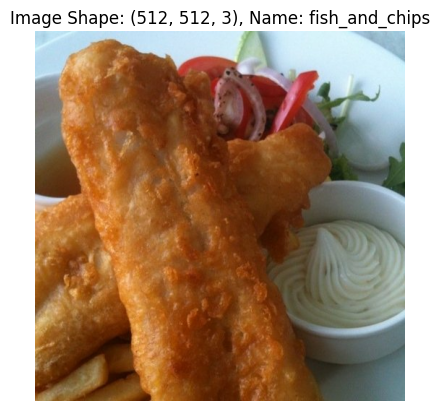

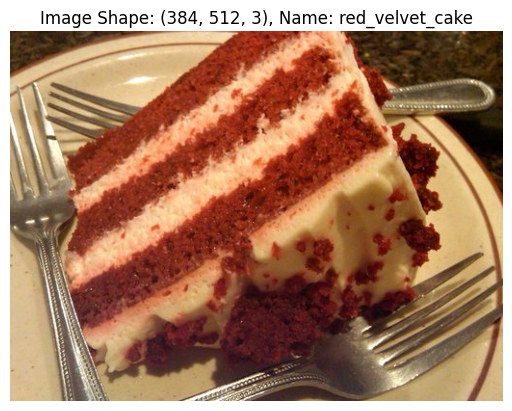

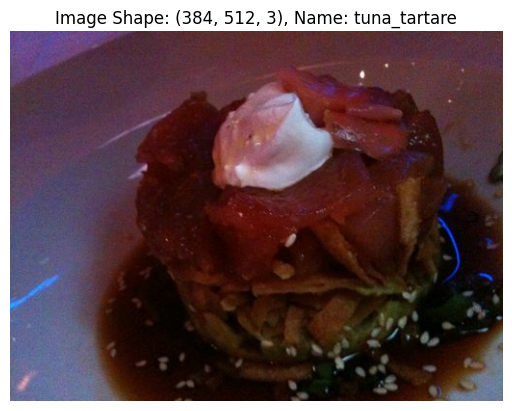

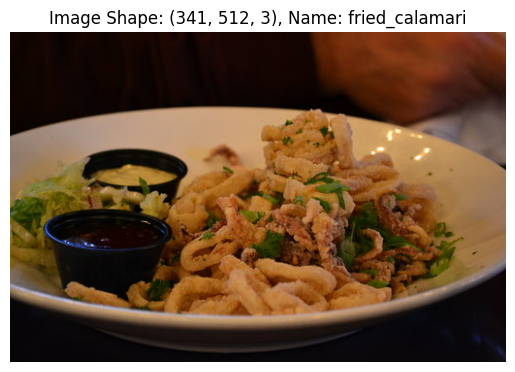

In [16]:
for image, label in train_data.take(4):
  plt.imshow(image)
  plt.title(f"Image Shape: {image.shape}, Name: {class_names[label.numpy()]}")
  plt.axis(False)
  plt.show()

# Preprocessing images

In [ ]:
IMG_SIZE = 224

def preprocess_image(image, label):
    img = tf.cast(image, tf.float32)  # Convert image to float32
    img = tf.image.resize(img, [IMG_SIZE, IMG_SIZE])  # Resize the image
    img = img / 255.0  # Normalize the image
    return img, label

# Starting with Pizza & Steak For Experiments

In [ ]:
def get_class_index(class_name):
  """
  Getting the index of the class name entered.
  """
  return class_names.index(class_name)

In [ ]:
get_class_index('pizza'), get_class_index('steak')

(76, 93)

In [ ]:
pizza_steak_train = train_data.filter(lambda image, label: label == get_class_index('pizza') or label == get_class_index('steak')).map(preprocess_image)
pizza_steak_train = pizza_steak_train.map(lambda image, label: (image, tf.where(tf.equal(label, 76), 0, 1))).repeat().batch(32).prefetch(buffer_size=tf.data.AUTOTUNE)

In [ ]:
pizza_steak_test = test_data.filter(lambda image, label: label == get_class_index('pizza') or label == get_class_index('steak')).map(preprocess_image)
pizza_steak_test = pizza_steak_test.batch(32).map(lambda image, label: (image, tf.where(tf.equal(label, 76), 0, 1))).prefetch(buffer_size=tf.data.AUTOTUNE)

In [ ]:
for image, label in pizza_steak_test.take(1):
  print(image.shape)
  print(len(label.numpy()))

(32, 224, 224, 3)
32


# Visulizing the data

In [ ]:
def show_random_images(skip_num=0, take_num=1, dataset=pizza_steak_train):
  """
  Showing 12 random samples of the data
  """
  plt.figure(figsize=(15, 10))
  for image, label in dataset.skip(skip_num).take(take_num):
    for i in range(12):
      plt.subplot(3, 4, i+1)
      plt.imshow(image[i])
      plt.title(f'{class_names[76 if label[i].numpy() == 0 else 93]}')
      plt.axis(False)


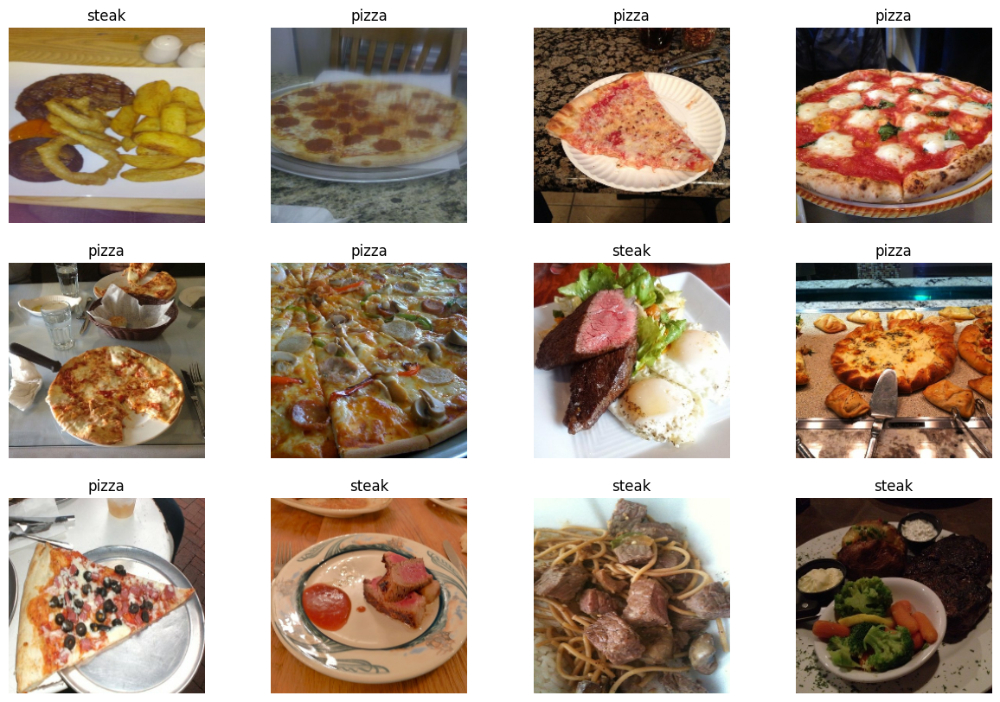

In [ ]:
show_random_images()

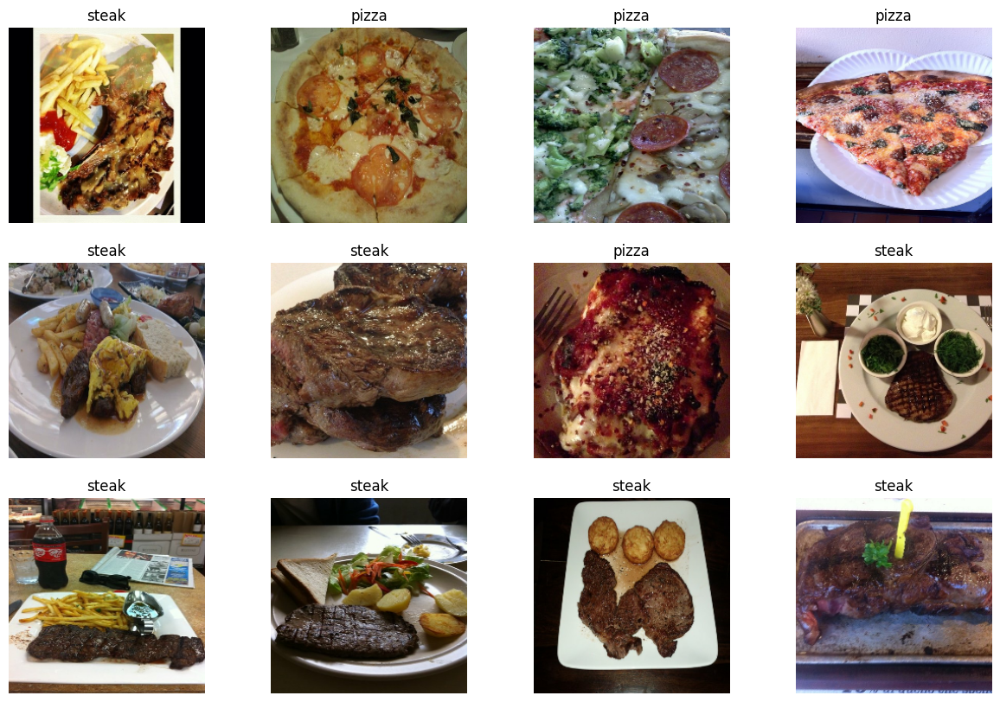

In [ ]:
show_random_images(1, 1)

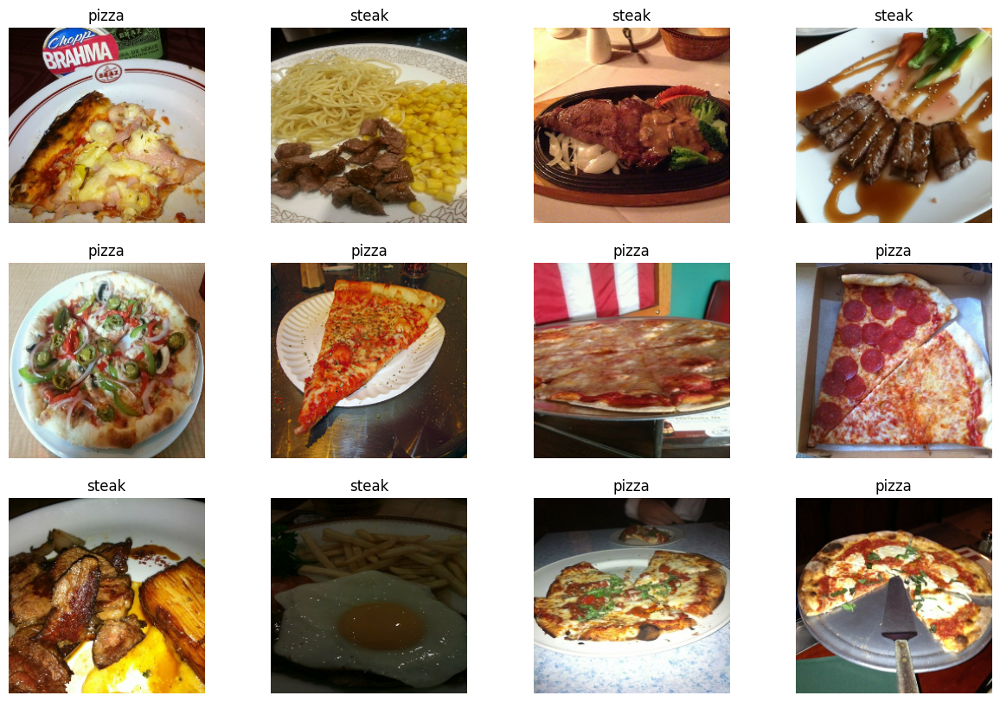

In [ ]:
show_random_images(40, 1)

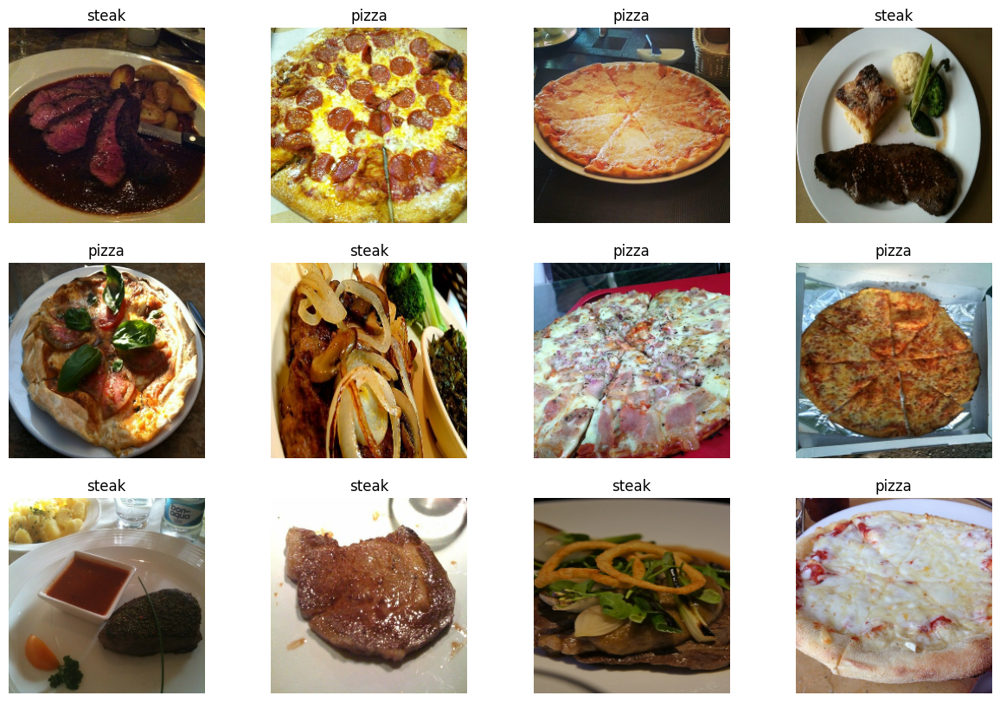

In [ ]:
show_random_images(0, 1, pizza_steak_test)

In [ ]:
# tf.data.Dataset.cardinality(pizza_steak_train)
# pizza_steak_train_list = list(pizza_steak_train)
# train_length = len(pizza_steak_train_list)
# print(train_length)

batch_size = 32
num_train_batches = 0

for _ in pizza_steak_train.batch(batch_size):
    num_train_batches += 1

print(num_train_batches)

In [ ]:
# pizza_steak_test_list = list(pizza_steak_test)
# test_length = len(pizza_steak_test_list)
# print(test_length)

batch_size = 32
num_test_batches = 0

for _ in pizza_steak_test.batch(batch_size):
    num_test_batches += 1

print(num_test_batches)

# Creating Callbacks Functions

In [ ]:
def create_early_stopping_callback(monitor='val_accuracy'):
  return tf.keras.callbacks.EarlyStopping(monitor=monitor, 
                                                  patience=3)

In [ ]:
def create_checkpoint_callback(path='/content/checkpoint', monitor='val_loss'):
  return tf.keras.callbacks.ModelCheckpoint(
    filepath=path,
    save_weights_only=True,  
    save_best_only=True,  
    monitor=monitor,  
    verbose=1)

# Building the model

In [ ]:
model = tf.keras.Sequential([
    tf.keras.layers.Conv2D(64, 3, activation='relu', input_shape=(IMG_SIZE, IMG_SIZE, 3)),
    tf.keras.layers.Conv2D(32, 3, activation='relu'),
    tf.keras.layers.MaxPooling2D(),

    tf.keras.layers.Conv2D(32, 3, activation='relu'),
    tf.keras.layers.Conv2D(32, 3, activation='relu'),
    tf.keras.layers.MaxPooling2D(),

    tf.keras.layers.Conv2D(10, 3, activation='relu'),
    tf.keras.layers.Conv2D(10, 3, activation='relu'),
    tf.keras.layers.MaxPooling2D(),

    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

model.compile(loss='binary_crossentropy',
              optimizer=tf.keras.optimizers.Adam(),
              metrics=['accuracy'])

history = model.fit(pizza_steak_train,
                    epochs=100,
                    steps_per_epoch=47,
                    validation_data=pizza_steak_test,
                    validation_steps=16,
                    callbacks=[create_early_stopping_callback()] 
                    )

Epoch 1/100
47/47 [==============================] - 148s 3s/step - loss: 0.6441 - accuracy: 0.6257 - val_loss: 0.5658 - val_accuracy: 0.7060
Epoch 2/100
47/47 [==============================] - 125s 3s/step - loss: 0.5432 - accuracy: 0.7507 - val_loss: 0.4469 - val_accuracy: 0.8220
Epoch 3/100
47/47 [==============================] - 126s 3s/step - loss: 0.4519 - accuracy: 0.8045 - val_loss: 0.3500 - val_accuracy: 0.8620
Epoch 4/100
47/47 [==============================] - 154s 3s/step - loss: 0.4190 - accuracy: 0.8185 - val_loss: 0.3343 - val_accuracy: 0.8540
Epoch 5/100
47/47 [==============================] - 111s 2s/step - loss: 0.3908 - accuracy: 0.8324 - val_loss: 0.3670 - val_accuracy: 0.8380
Epoch 6/100
47/47 [==============================] - 154s 3s/step - loss: 0.3639 - accuracy: 0.8464 - val_loss: 0.3435 - val_accuracy: 0.8420


<Axes: >

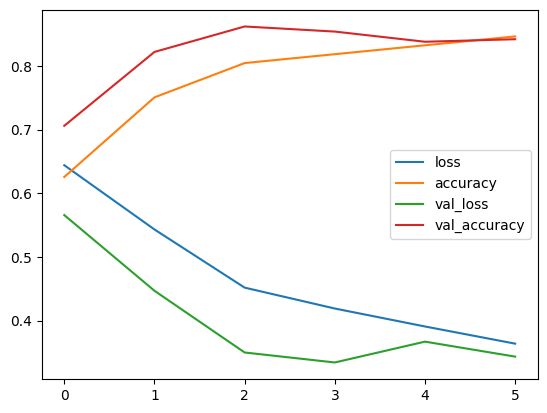

In [ ]:
import pandas as pd

pd.DataFrame(history.history).plot()

In [ ]:
def plot_loss_curves(history):
  """
  Returns separate loss curves for training and validation metrics 
  """
  loss = history.history['loss']
  val_loss = history.history['val_loss']

  accuracy = history.history['accuracy']
  val_accuracy = history.history['val_accuracy']

  epochs = range(len(history.history['loss']))

  # plot loss
  plt.plot(epochs, loss, label='training loss')
  plt.plot(epochs, val_loss, label='val loss')
  plt.title("Loss")
  plt.xlabel('Epochs')
  plt.legend()

  # plot the accuracy
  plt.figure()
  plt.plot(epochs, accuracy, label='Accuracy')
  plt.plot(epochs, val_accuracy, label='val Accuracy')
  plt.title("Accuracy")
  plt.xlabel('Epochs')
  plt.legend()

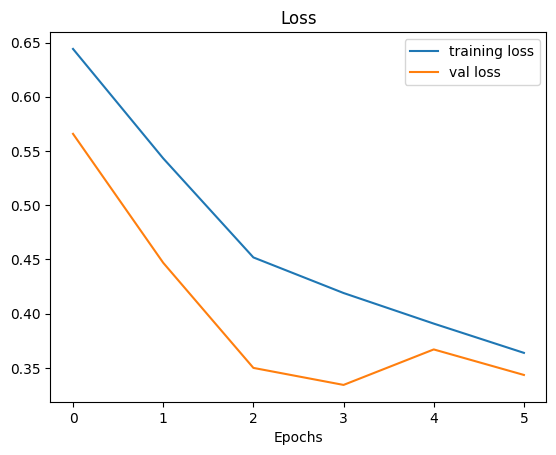

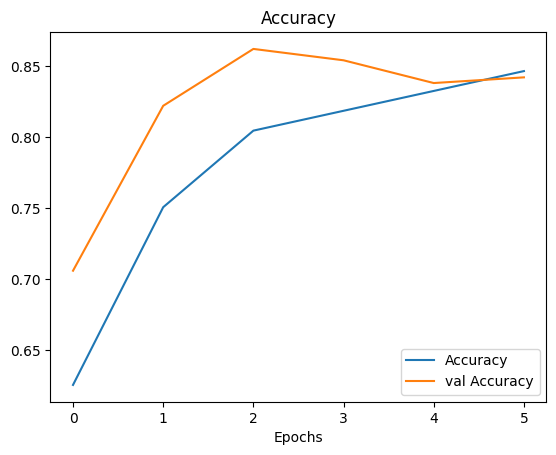

In [ ]:
plot_loss_curves(history)

# Evaluation

In [ ]:
model.evaluate(pizza_steak_test)

16/16 [==============================] - 36s 2s/step - loss: 0.3435 - accuracy: 0.8420


[0.3434843420982361, 0.8420000076293945]

In [ ]:
def test_visualize(dataset=pizza_steak_test, skip_num=0, take_num=1, model_class=model):
  plt.figure(figsize=(15, 10))
  for image_test, label_test in dataset.skip(skip_num).take(take_num):
    for i in range(12):
      plt.subplot(6, 2, i+1)
      first_image = image_test[i]
      first_label = label_test[i].numpy()

      actual_value = class_names[76 if first_label == 0 else 93]
    
      prediction = model_class.predict(tf.expand_dims(first_image, axis=0))

      predicted_class = class_names[76 if prediction[0] < 0.5 else 93]

      if actual_value == predicted_class:
        color = 'green'
      else: 
        color = 'red'
      
      plt.imshow(first_image)
      plt.title(f"Actual: {actual_value}, predicted: {predicted_class}", color=color)
      plt.axis(False);

1/1 [==============================] - 0s 30ms/step


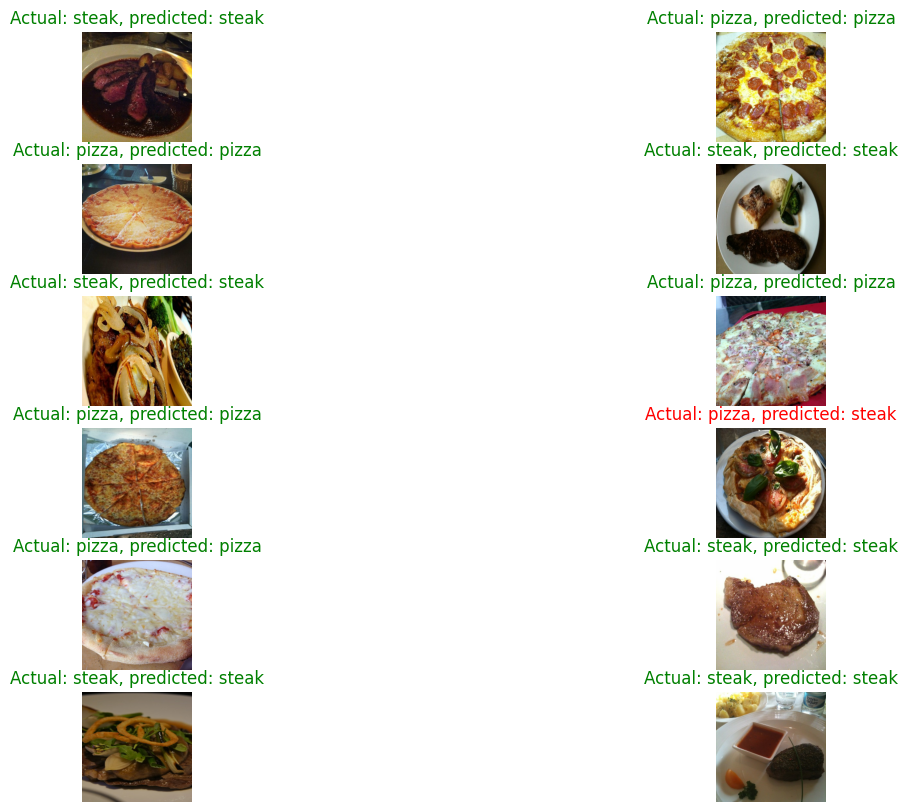

In [ ]:
test_visualize()

1/1 [==============================] - 0s 19ms/step


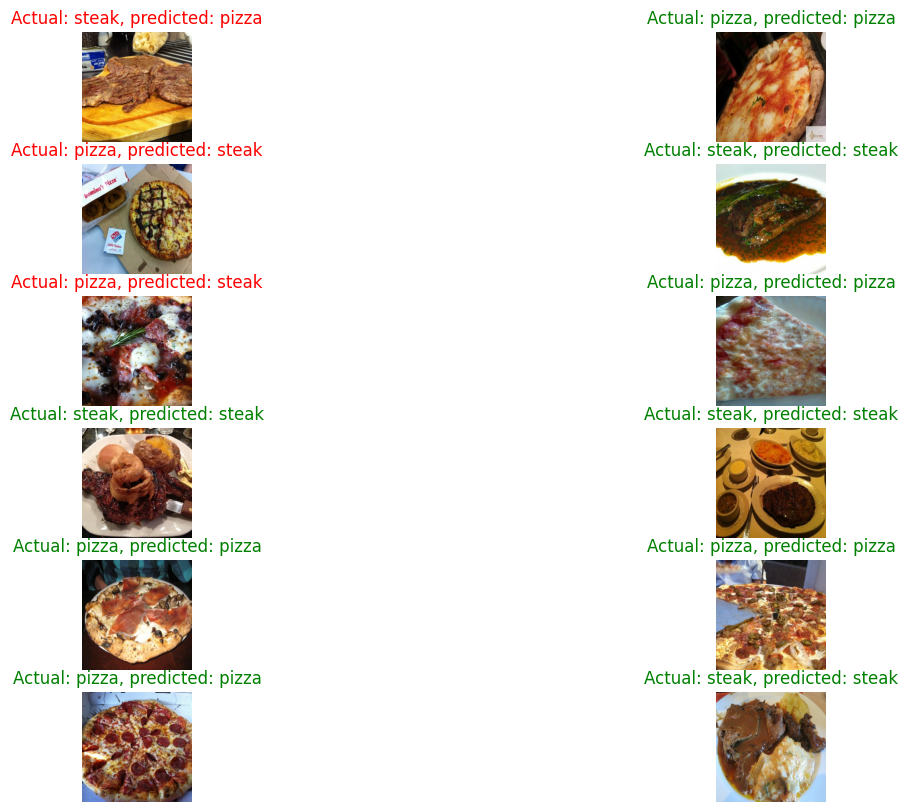

In [ ]:
test_visualize(skip_num=3, take_num=1)

1/1 [==============================] - 0s 91ms/step


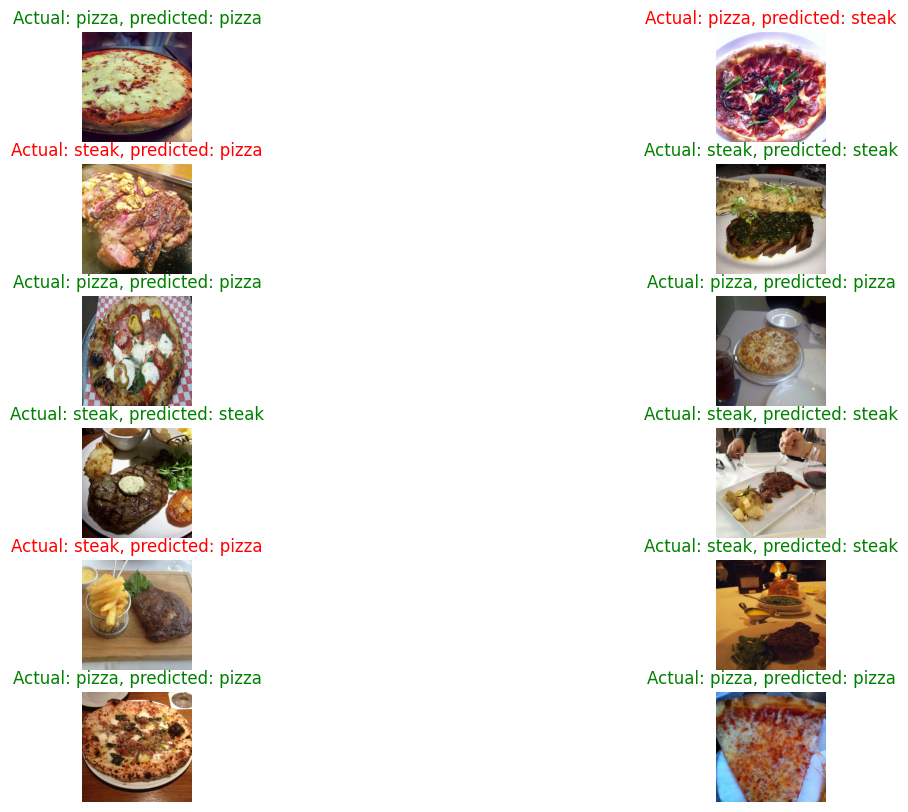

In [ ]:
test_visualize(skip_num=10, take_num=1)

In [ ]:
model_2 = tf.keras.Sequential([
    tf.keras.layers.Conv2D(32, 3, activation='relu', input_shape=(IMG_SIZE, IMG_SIZE, 3)),
    tf.keras.layers.MaxPooling2D(),
    tf.keras.layers.Conv2D(64, 3, activation='relu'),
    tf.keras.layers.MaxPooling2D(),
    tf.keras.layers.Conv2D(128, 3, activation='relu'),
    tf.keras.layers.MaxPooling2D(),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

model_2.compile(loss='binary_crossentropy',
              optimizer=tf.keras.optimizers.SGD(),
              metrics=['accuracy'])

history_2 = model_2.fit(pizza_steak_train,
                    epochs=100,
                    steps_per_epoch=47,
                    validation_data=pizza_steak_test,
                    validation_steps=16,
                    callbacks=[create_early_stopping_callback()] 
                    )

Epoch 1/100
47/47 [==============================] - 149s 3s/step - loss: 0.6348 - accuracy: 0.6636 - val_loss: 0.5621 - val_accuracy: 0.7080
Epoch 2/100
47/47 [==============================] - 122s 3s/step - loss: 0.5582 - accuracy: 0.7227 - val_loss: 0.5958 - val_accuracy: 0.6740
Epoch 3/100
47/47 [==============================] - 162s 4s/step - loss: 0.5308 - accuracy: 0.7520 - val_loss: 0.4808 - val_accuracy: 0.7880
Epoch 4/100
47/47 [==============================] - 118s 3s/step - loss: 0.4959 - accuracy: 0.7759 - val_loss: 0.4434 - val_accuracy: 0.8180
Epoch 5/100
47/47 [==============================] - 129s 3s/step - loss: 0.4781 - accuracy: 0.7859 - val_loss: 0.4512 - val_accuracy: 0.8000
Epoch 6/100
47/47 [==============================] - 138s 3s/step - loss: 0.4653 - accuracy: 0.7906 - val_loss: 0.4284 - val_accuracy: 0.8160
Epoch 7/100
47/47 [==============================] - 135s 3s/step - loss: 0.4502 - accuracy: 0.7999 - val_loss: 0.4039 - val_accuracy: 0.8300
Epoch 

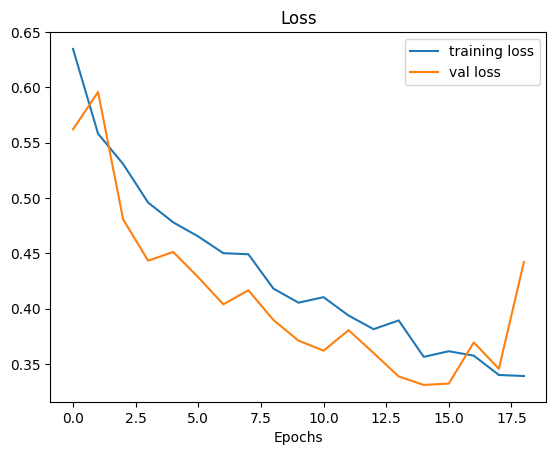

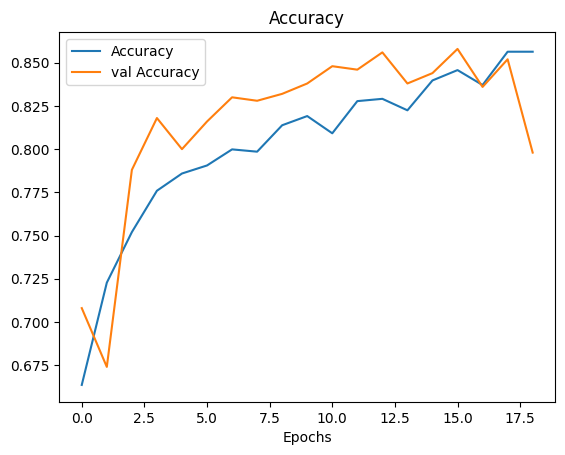

In [ ]:
plot_loss_curves(history_2)

1/1 [==============================] - 0s 28ms/step


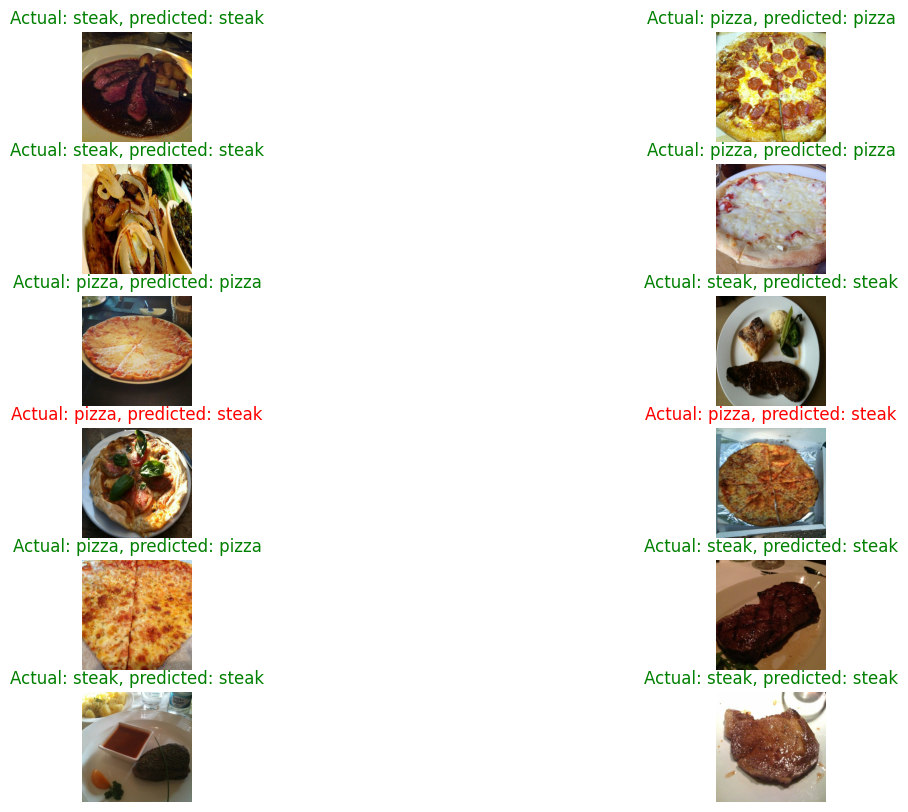

In [ ]:
test_visualize(model_class=model_2)

In [ ]:
model_3 = tf.keras.Sequential([
    tf.keras.layers.Conv2D(64, 3, activation='relu', input_shape=(IMG_SIZE, IMG_SIZE, 3)),
    tf.keras.layers.Conv2D(64, 3, activation='relu'),
    tf.keras.layers.MaxPooling2D(),
    
    tf.keras.layers.Conv2D(32, 3, activation='relu'),
    tf.keras.layers.Conv2D(32, 3, activation='relu'),
    tf.keras.layers.Conv2D(32, 3, activation='relu'),
    tf.keras.layers.MaxPooling2D(),
    
    tf.keras.layers.Conv2D(10, 3, activation='relu'),
    tf.keras.layers.Conv2D(10, 3, activation='relu'),
    tf.keras.layers.Conv2D(10, 3, activation='relu'),
    tf.keras.layers.MaxPooling2D(),

    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

model_3.compile(loss='binary_crossentropy',
              optimizer=tf.keras.optimizers.Adam(),
              metrics=['accuracy'])

history_3 = model_3.fit(pizza_steak_train,
                    epochs=100,
                    steps_per_epoch=47,
                    validation_data=pizza_steak_test,
                    validation_steps=8,
                    callbacks=[create_early_stopping_callback(monitor='accuracy')] 
                    )



Epoch 1/100
47/47 [==============================] - 119s 2s/step - loss: 0.6357 - accuracy: 0.6277 - val_loss: 0.5111 - val_accuracy: 0.7773
Epoch 2/100
47/47 [==============================] - 109s 2s/step - loss: 0.5096 - accuracy: 0.7726 - val_loss: 0.4194 - val_accuracy: 0.8398
Epoch 3/100
47/47 [==============================] - 125s 3s/step - loss: 0.4579 - accuracy: 0.7899 - val_loss: 0.4126 - val_accuracy: 0.8164
Epoch 4/100
47/47 [==============================] - 106s 2s/step - loss: 0.4074 - accuracy: 0.8172 - val_loss: 0.3945 - val_accuracy: 0.8438
Epoch 5/100
47/47 [==============================] - 108s 2s/step - loss: 0.3891 - accuracy: 0.8258 - val_loss: 0.4411 - val_accuracy: 0.7891
Epoch 6/100
47/47 [==============================] - 104s 2s/step - loss: 0.3639 - accuracy: 0.8431 - val_loss: 0.4028 - val_accuracy: 0.8164
Epoch 7/100
47/47 [==============================] - 105s 2s/step - loss: 0.2944 - accuracy: 0.8783 - val_loss: 0.4605 - val_accuracy: 0.7852
Epoch 

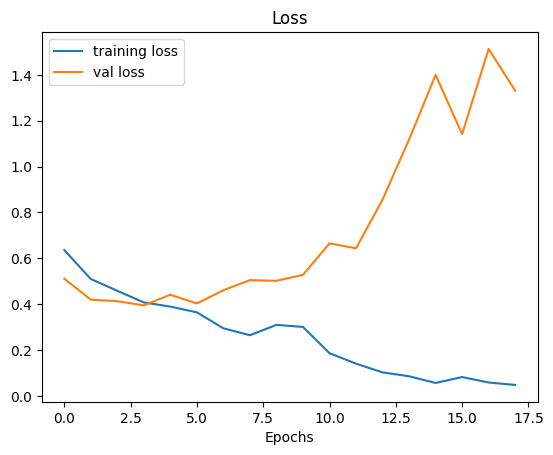

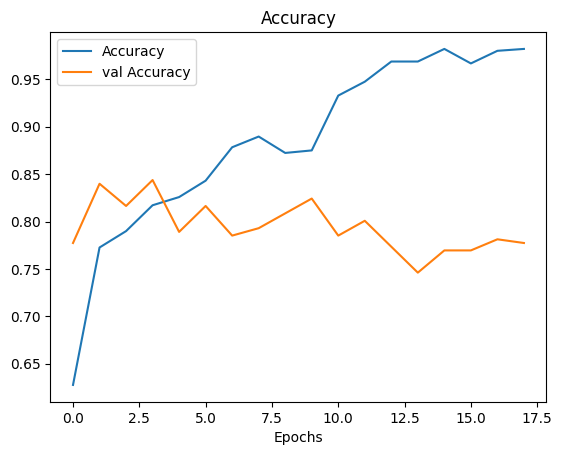

In [ ]:
plot_loss_curves(history_3)

1/1 [==============================] - 0s 22ms/step


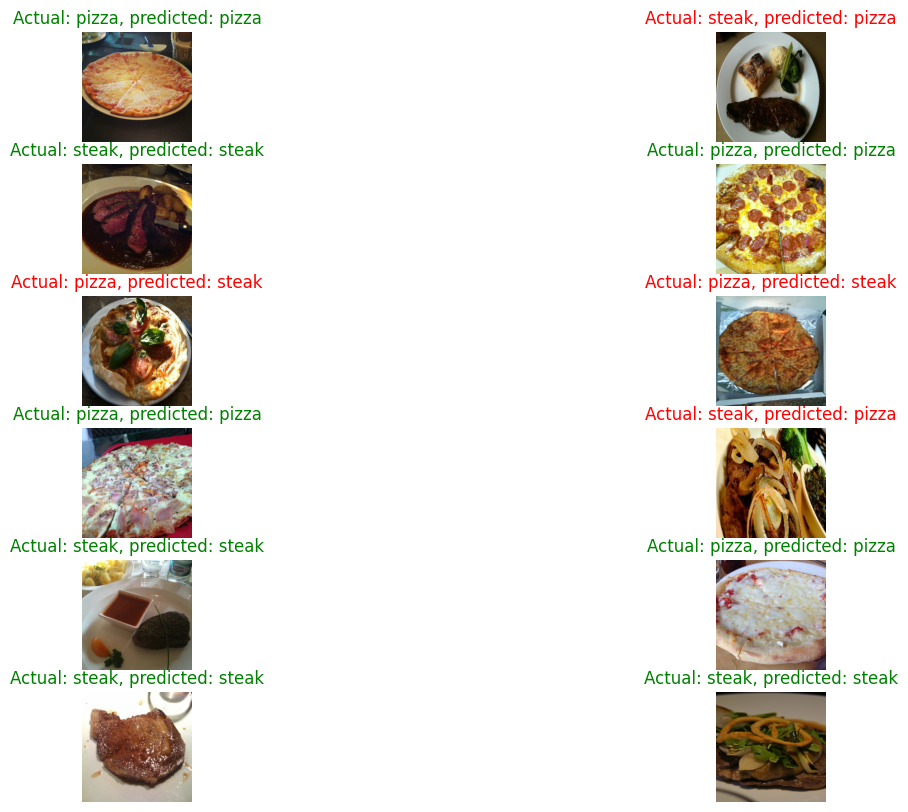

In [ ]:
test_visualize(model_class=model_3)

In [ ]:
model_4 = tf.keras.Sequential([
    tf.keras.layers.Conv2D(10, 3, activation='relu', input_shape=(IMG_SIZE, IMG_SIZE, 3),),
    tf.keras.layers.MaxPool2D(pool_size=2),
    tf.keras.layers.Conv2D(10, 3, activation='relu'),
    tf.keras.layers.MaxPool2D(),
    tf.keras.layers.Conv2D(10, 3, activation='relu'),
    tf.keras.layers.MaxPool2D(),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1, activation='sigmoid'),
])

model_4.compile(
    loss='binary_crossentropy',
    optimizer=tf.keras.optimizers.Adam(),
    metrics=['accuracy']);

history_4 = model_4.fit(pizza_steak_train,
                    epochs=100,
                    steps_per_epoch=47,
                    validation_data=pizza_steak_test,
                    validation_steps=8,
                    callbacks=[create_early_stopping_callback(monitor='val_accuracy')] 
                    )

Epoch 1/100
47/47 [==============================] - 120s 2s/step - loss: 0.6063 - accuracy: 0.6576 - val_loss: 0.4908 - val_accuracy: 0.7773
Epoch 2/100
47/47 [==============================] - 132s 3s/step - loss: 0.4618 - accuracy: 0.7952 - val_loss: 0.3578 - val_accuracy: 0.8516
Epoch 3/100
47/47 [==============================] - 155s 3s/step - loss: 0.4183 - accuracy: 0.8125 - val_loss: 0.3510 - val_accuracy: 0.8438
Epoch 4/100
47/47 [==============================] - 179s 4s/step - loss: 0.3848 - accuracy: 0.8318 - val_loss: 0.3362 - val_accuracy: 0.8516
Epoch 5/100
47/47 [==============================] - 106s 2s/step - loss: 0.3732 - accuracy: 0.8444 - val_loss: 0.3266 - val_accuracy: 0.8672
Epoch 6/100
47/47 [==============================] - 113s 2s/step - loss: 0.3563 - accuracy: 0.8497 - val_loss: 0.3130 - val_accuracy: 0.8516
Epoch 7/100
47/47 [==============================] - 95s 2s/step - loss: 0.3345 - accuracy: 0.8617 - val_loss: 0.3215 - val_accuracy: 0.8516
Epoch 8

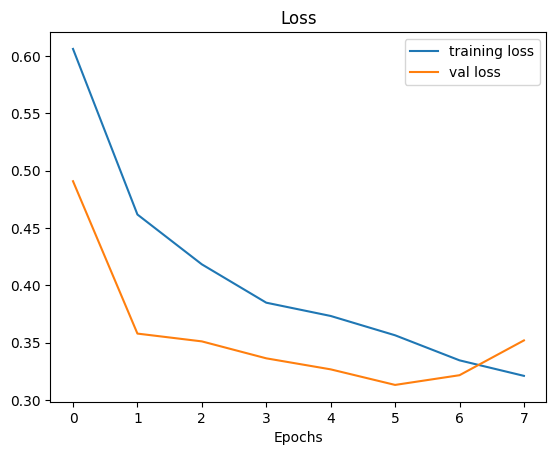

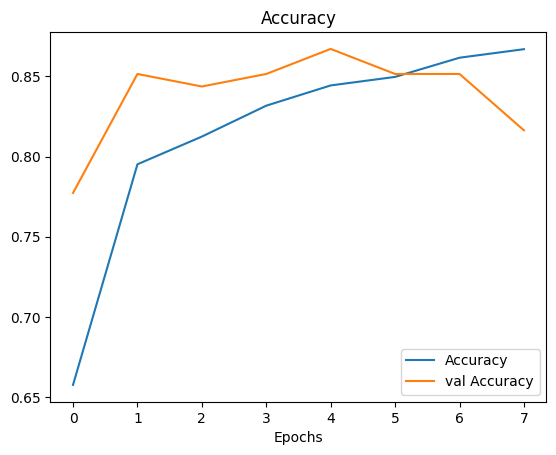

In [ ]:
plot_loss_curves(history_4)

1/1 [==============================] - 0s 24ms/step


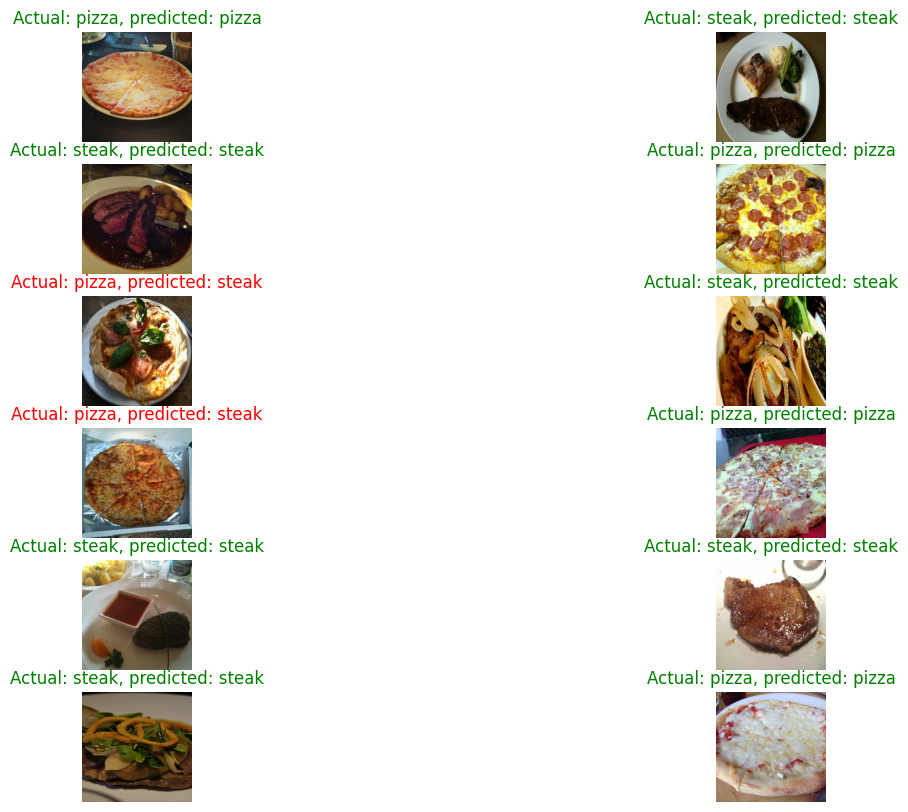

In [ ]:
test_visualize(model_class=model_4)

# Start Using Transfer Learning

Using it as feature extractor

In [ ]:
# creating the base model
base_model = tf.keras.applications.EfficientNetB0(include_top=False)

# set the transfer learning model as a feature extractor
base_model.trainable = False

# Define the inputs layer
inputs = tf.keras.layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3), name='Input_layer')

# initialize the base model and connect it to the inputs layer
x = base_model(inputs, training=False)

# To Take the important features from the image
x= tf.keras.layers.GlobalAveragePooling2D(name="global_average_pooling")(x)

# the output layer
outputs = tf.keras.layers.Dense(1, activation='sigmoid', name='output_layer')(x) 

model_5 = tf.keras.Model(inputs, outputs)

model_5.compile(loss='binary_crossentropy',
                optimizer=tf.keras.optimizers.SGD(),
                metrics=['accuracy'])

history_5 = model_5.fit(pizza_steak_train,
                    epochs=100,
                    steps_per_epoch=47,
                    validation_data=pizza_steak_test,
                    validation_steps=8,
                    callbacks=[create_early_stopping_callback(monitor='val_accuracy')] 
                    )


Epoch 1/100
15/47 [========>.....................] - ETA: 55s - loss: 0.6943 - accuracy: 0.4917